In [1]:
import sympy as sp 
import numpy as np
import pandas as pd

# Statics Cylinder Terrain Trajectory

Here we consider the case where left leg lands on the left circle and right leg lands on the right circle. Notes: the assumption that two legs ends always contacting the terrain holds here. Define the terrain and the robots

In [2]:
# Known
x1, y1 = sp.symbols('x1 y1')      # C1 center
x2, y2 = sp.symbols('x2 y2')      # C2 center
r, L, psi, beta = sp.symbols('r L psi beta') # Radius, arm length, direction angle, pitch angle

L_spine, H2, H1 = sp.symbols('L_spine H2 H1') # auxilliary parameters, H refers to leg length

L = sp.sqrt(L_spine**2 + (H2 - H1)**2)
psi = sp.atan((H2 - H1) / L_spine) - beta

# direction vector
dx = L * sp.cos(psi)
dy = L * sp.sin(psi)

# Unkown
xA, yA = sp.symbols('xA yA')      # A position

# point P position
xP = xA + dx
yP = yA + dy

# Normal at A: vector from C1 to A
nA = sp.Matrix([(xA - x1), (yA - y1)])
nA_unit = nA / sp.sqrt(nA.dot(nA))

# Tangent at A: 90° clockwise rotation of nA
tA_unit = sp.Matrix([-nA_unit[1], nA_unit[0]])

# Normal at P: vector from C2 to P
nP = sp.Matrix([(xP - x2), (yP - y2)])
nP_unit = nP / sp.sqrt(nP.dot(nP))

# Tangent at P: 90° clockwise rotation of nP
tP_unit = sp.Matrix([-nP_unit[1], nP_unit[0]])

# constraint that AP are on the circle 1 and 2
eq1 = (xA - x1)**2 + (yA - y1)**2 - r**2
eq2 = (xP - x2)**2 + (yP - y2)**2 - r**2

Numerical solution

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


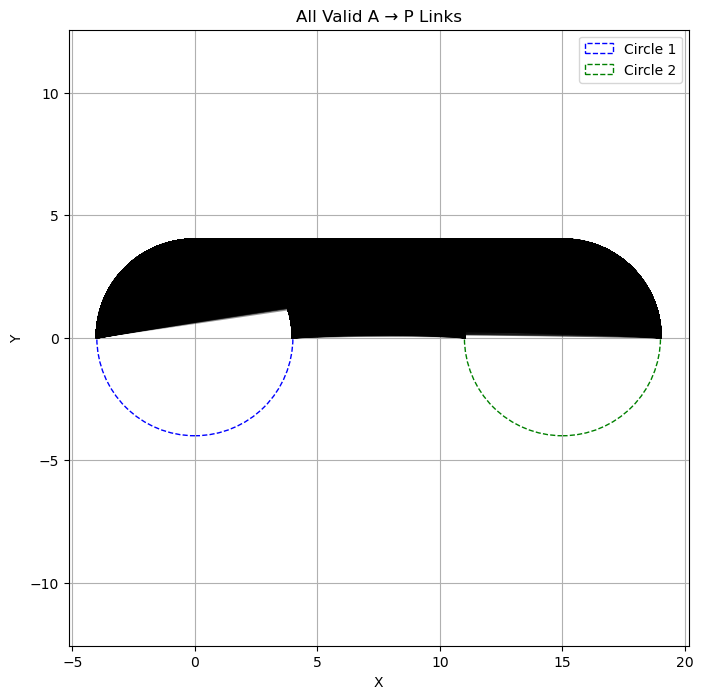

In [3]:
# Fixed parameters
fixed_params = {
    x1: 0.0,
    y1: 0.0,
    x2: 15.0,
    y2: 0.0,
    r: 4.0,
    H1: 0.0,
}

# Grid ranges
H2_vals = np.arange(0, 5 + 1, 0.1)
Lspine_vals = np.arange(5, 20 + 1, 0.1)
beta_vals = np.arange(-np.pi/4, np.pi/4 + 0.01, np.pi/200)

results = []

for h2 in H2_vals:
    for lsp in Lspine_vals:
        for b in beta_vals:
            param_set = fixed_params.copy()
            param_set[H2] = h2
            param_set[L_spine] = lsp
            param_set[beta] = b

            try:
                # Evaluate constraints
                eq1_eval = eq1.subs(param_set)
                eq2_eval = eq2.subs(param_set)

                # Solve numerically
                sol = sp.nsolve([eq1_eval, eq2_eval], (xA, yA), (1.0, 1.0))
                xA_val, yA_val = map(float, sol)

                dx_val = float(dx.subs(param_set).evalf())
                dy_val = float(dy.subs(param_set).evalf())
                xP_val = xA_val + dx_val
                yP_val = yA_val + dy_val

                # Reject if any y < 0
                if yA_val < 0 or yP_val < 0:
                    raise ValueError("yA or yP < 0")

                # Vectors: nA = A - C1, tA = rotate -90° (CW)
                nA = np.array([xA_val - fixed_params[x1], yA_val - fixed_params[y1]])
                tA = np.array([-nA[1], nA[0]])

                nP = np.array([xP_val - fixed_params[x2], yP_val - fixed_params[y2]])
                tP = np.array([-nP[1], nP[0]])

                nA_unit = nA / np.linalg.norm(nA)
                tA_unit = tA / np.linalg.norm(tA)
                nP_unit = nP / np.linalg.norm(nP)
                tP_unit = tP / np.linalg.norm(tP)

                results.append({
                    'H2': h2,
                    'L_spine': lsp,
                    'beta': b,
                    'xA': xA_val,
                    'yA': yA_val,
                    'xP': xP_val,
                    'yP': yP_val,
                    'tA_x': tA_unit[0],
                    'tA_y': tA_unit[1],
                    'nA_x': nA_unit[0],
                    'nA_y': nA_unit[1],
                    'tP_x': tP_unit[0],
                    'tP_y': tP_unit[1],
                    'nP_x': nP_unit[0],
                    'nP_y': nP_unit[1],
                })

            except Exception:
                results.append({
                    'H2': h2,
                    'L_spine': lsp,
                    'beta': b,
                    'xA': None,
                    'yA': None,
                    'xP': None,
                    'yP': None,
                    'tA_x': None,
                    'tA_y': None,
                    'nA_x': None,
                    'nA_y': None,
                    'tP_x': None,
                    'tP_y': None,
                    'nP_x': None,
                    'nP_y': None,
                })

# Save and display
df_results = pd.DataFrame(results)
df_results.to_csv("grid_search_with_angles.csv", index=False)
# print(df_results.head())

import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("grid_search_with_angles.csv")
df_valid = df.dropna()

plt.figure(figsize=(8, 8))
plt.title("All Valid A → P Links")
plt.xlabel("X")
plt.ylabel("Y")
plt.axis("equal")

r = 4.0
circle1 = plt.Circle((0, 0), r, color='blue', fill=False, linestyle='--', label='Circle 1')
circle2 = plt.Circle((15, 0), r, color='green', fill=False, linestyle='--', label='Circle 2')
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)

for _, row in df_valid.iterrows():
    plt.plot([row["xA"], row["xP"]], [row["yA"], row["yP"]], 'k-', alpha=0.4)

plt.legend()
plt.grid(True)
plt.show()

Skipping row 2165 due to error: No valid B found (yB > yP)
Skipping row 2168 due to error: No valid B found (yB > yP)
Skipping row 2169 due to error: No valid B found (yB > yP)
Skipping row 2170 due to error: No valid B found (yB > yP)
Skipping row 2171 due to error: No valid B found (yB > yP)
Skipping row 2172 due to error: No valid B found (yB > yP)
Skipping row 2175 due to error: No valid B found (yB > yP)
Skipping row 2176 due to error: No valid B found (yB > yP)
Skipping row 2264 due to error: No valid B found (yB > yP)
Skipping row 2265 due to error: No valid B found (yB > yP)
Skipping row 2266 due to error: No valid B found (yB > yP)
Skipping row 2269 due to error: No valid B found (yB > yP)
Skipping row 2270 due to error: No valid B found (yB > yP)
Skipping row 2271 due to error: No valid B found (yB > yP)
Skipping row 2272 due to error: No valid B found (yB > yP)
Skipping row 2273 due to error: No valid B found (yB > yP)
Skipping row 2276 due to error: No valid B found (yB > y

/Users/jerrywu/Desktop/BECOv2/simulation/Analysis/compute_com.py:21: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  xB_val, yB_val = fsolve(equations, guess)


Skipping row 4212 due to error: No valid B found (yB > yP)
Skipping row 4213 due to error: No valid B found (yB > yP)
Skipping row 4272 due to error: No valid B found (yB > yP)
Skipping row 4273 due to error: No valid B found (yB > yP)
Skipping row 4275 due to error: No valid B found (yB > yP)
Skipping row 4278 due to error: No valid B found (yB > yP)
Skipping row 4279 due to error: No valid B found (yB > yP)
Skipping row 4280 due to error: No valid B found (yB > yP)
Skipping row 4281 due to error: No valid B found (yB > yP)
Skipping row 4282 due to error: No valid B found (yB > yP)
Skipping row 4284 due to error: No valid B found (yB > yP)
Skipping row 4285 due to error: No valid B found (yB > yP)
Skipping row 4286 due to error: No valid B found (yB > yP)
Skipping row 4289 due to error: No valid B found (yB > yP)
Skipping row 4290 due to error: No valid B found (yB > yP)
Skipping row 4291 due to error: No valid B found (yB > yP)
Skipping row 4292 due to error: No valid B found (yB > y

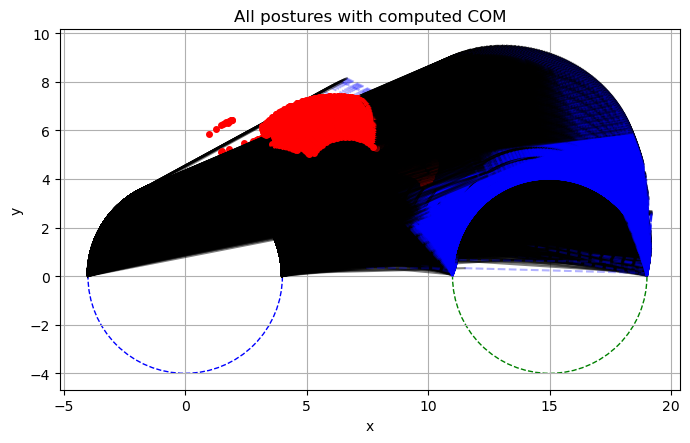

In [4]:
from compute_com import compute_com
import matplotlib.pyplot as plt
import numpy as np

df_valid = df_valid.copy()
df_valid["xCOM"] = np.nan
df_valid["yCOM"] = np.nan


plt.figure(figsize=(8, 6))

for idx, row in df_valid.iterrows():
    try:
        xCOM, yCOM, xA, yA, xB, yB, xP, yP = compute_com(
            row["xA"], row["yA"],
            row["xP"], row["yP"],
            row["L_spine"],
            row["H2"]
        )

        df_valid.at[idx, "xCOM"] = xCOM
        df_valid.at[idx, "yCOM"] = yCOM

        plt.plot([xA, xB], [yA, yB], 'k-', alpha=0.5)        # spine
        plt.plot([xB, xP], [yB, yP], 'b--', alpha=0.3)       # leg
        plt.plot(xCOM, yCOM, 'ro', markersize=4)            # COM

    except Exception as e:
        print(f"Skipping row {idx} due to error: {e}")

r = 4.0
circle1 = plt.Circle((0, 0), r, color='blue', fill=False, linestyle='--', label='Circle 1')
circle2 = plt.Circle((15, 0), r, color='green', fill=False, linestyle='--', label='Circle 2')
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().set_aspect('equal')
plt.xlabel('x')
plt.ylabel('y')
plt.title(f"All postures with computed COM")
plt.grid(True)
plt.show()

df_valid.to_csv("df_valid_with_com.csv", index=False)


In [13]:
import pandas as pd
import numpy as np
from build_static_matrix import build_static_matrix 
import matplotlib.pyplot as plt

df = pd.read_csv("df_valid_with_com.csv")
df_valid = df.dropna()
# df_valid = df_valid[(df_valid["xP"] <= 15) & (df_valid["xA"] >= 0)].copy()
df_valid = df_valid.copy()

df_valid["f1"] = np.nan
df_valid["f2"] = np.nan
df_valid["NA"] = np.nan
df_valid["NB"] = np.nan

for idx, row in df_valid.iterrows():
    t1 = [row["tA_x"], row["tA_y"]]
    t2 = [row["tP_x"], row["tP_y"]]
    n1 = [row["nA_x"], row["nA_y"]]
    n2 = [row["nP_x"], row["nP_y"]]
    
    xA, yA = row["xA"], row["yA"]
    xB, yB = row["xP"], row["yP"]  
    xCOM = row["xCOM"]
    mass = 1.0  

    try:
        A_matrix, b_matrix = build_static_matrix(t1, t2, n1, n2, xA, yA, xB, yB, xCOM, mass)
        x_sol, residuals, rank, s = np.linalg.lstsq(A_matrix, b_matrix, rcond=None)
        f1, f2, NA, NB = x_sol

        df_valid.at[idx, "f1"] = f1
        df_valid.at[idx, "f2"] = f2
        df_valid.at[idx, "NA"] = NA
        df_valid.at[idx, "NB"] = NB

    except Exception as e:
        print(f"Row {idx} failed: {e}")
        continue

df_valid.to_csv("df_valid_with_forces.csv", index=False)


In [17]:
import plotly.express as px
df = pd.read_csv("df_valid_with_forces.csv")
df_valid = df.dropna()
df_valid = df_valid.copy()

mu = 1

df_valid["slip_status"] = np.where(
    (np.abs(df_valid["f1"]) > mu * df_valid["NA"]) | 
    (np.abs(df_valid["f2"]) > mu * df_valid["NB"]),
    "slip", "stick"
)

fig = px.scatter_3d(
    df_valid,
    x="L_spine", y="H2", z="beta",
    color="slip_status",
    color_discrete_map={"slip": "red", "stick": "white"},
    labels={"x": "L_spine", "y": "H2", "z": "beta"},
    title=f"Slip detection with μ = {mu}",
    width=600,
    height=500  
)
fig.show()

